In [172]:
# import basic libraries
import pandas as pd
import numpy as np
import glob
import os

# import plotting
import matplotlib.patches as patches
import matplotlib.pyplot as plt
%matplotlib inline

# import image manipulation
from skimage.transform import resize
from skimage import img_as_bool

#Tensorflow
import tensorflow as tf

#import cv2

#import seaborn as sns
from PIL import Image
#import imageio
#! pip install --upgrade imgaug'
# import data augmentation
#import imgaug as ia
#from imgaug import augmenters as iaa
# import segmentation maps from imaug
#from imgaug.augmentables.segmaps import SegmentationMapOnImage
#import imgaug.imgaug
#import albumentations as albu

In [173]:
#Parameters
img_height= 352
img_width= 512
batch_size= 16
#TRAIN_PATH = '/content/drive/MyDrive/cloud_segmentation/train_images/'
TRAIN_PATH ='train_images/'
# selection of number of pictures used for training, validation, testing, overall there are 5546 pictures in the training folder
train, valid, test = 4946, 300 , 300
BATCH_SIZE = 16
BUFFER_SIZE = 256
NUM_EPOCHS = 15
VAL_SUBSPLITS = 1

**Helper functions Preprocessing**

In [174]:
# Functions for preprocessing

def augment(input_image, input_mask):
    if tf.random.uniform(()) > 0.5:
       # Random flipping of the image and mask
        input_image = tf.image.flip_left_right(input_image)
        input_mask = tf.image.flip_left_right(input_mask)

    return input_image, input_mask

def normalize(input_image):
    input_image = tf.cast(input_image, tf.float32) / 255.0
    return input_image

def load_image_train(input_image, input_mask):
    input_image, input_mask = augment(input_image, input_mask)
    input_image = normalize(input_image)

    return input_image, input_mask

def load_image_test(input_image, input_mask):
   #input_image, input_mask = resize(input_image, input_mask)
    input_image= normalize(input_image)
    return input_image, input_mask

**Helper functions for generating the masks**

In [175]:
def rle_to_mask(rle):
    ''' Turns a rle-label into a single numpy mask '''
    #split rle-string into list, change type to int, turn list into np-array, reshape into two columns containing the inexes and length of the individual labels
    rle=rle.split(' ')
    rle=[int(string) for string in rle]
    rle=np.array(rle)
    rle=rle.reshape(-1,2)

    # Create empty mask and reshape into one dimension
    mask=np.zeros((1400,2100,1))
    mask=mask.reshape(-1)

    # iterate over the individual labels and color the labeled pixels white
    for line in rle:
        start=line[0]-1
        end=line[0]+line[1]
        mask[start:end]=1

    # turn the one-dim array back into original shape (first column wise, because the labels are coumnwise )
    mask=mask.reshape(2100,1400)
    mask=mask.T

    return mask

**Data generators to fetch masks and images and creation of tf.datasets**

In [144]:
train=pd.read_csv('train.csv')
train.head()
train['im_id'] = train['Image_Label'].apply(lambda x: x.split('_')[0])
display(train.head())   
train_fns = sorted(glob.glob((TRAIN_PATH) + '*.jpg'))
print(train_fns[0:50])
print(len(train_fns))
img_names=[path.split('\\')[-1] for path in train_fns]
print(img_names[0:50])
display(train['EncodedPixels'].values[0:10])

,Image_Label,EncodedPixels,im_id
0,0011165.jpg_Fish,264918 937 266318 937 267718 937 269118 937 27...,0011165.jpg
1,0011165.jpg_Flower,1355565 1002 1356965 1002 1358365 1002 1359765...,0011165.jpg
2,0011165.jpg_Gravel,NaN,0011165.jpg
3,0011165.jpg_Sugar,NaN,0011165.jpg
4,002be4f.jpg_Fish,233813 878 235213 878 236613 878 238010 881 23...,002be4f.jpg


['train_images\\0011165.jpg', 'train_images\\002be4f.jpg', 'train_images\\0031ae9.jpg', 'train_images\\0035239.jpg', 'train_images\\003994e.jpg', 'train_images\\00498ec.jpg', 'train_images\\006bf7c.jpg', 'train_images\\006c5a6.jpg', 'train_images\\008233e.jpg', 'train_images\\008a5ff.jpg', 'train_images\\0091591.jpg', 'train_images\\0095357.jpg', 'train_images\\009e2f3.jpg', 'train_images\\00a0954.jpg', 'train_images\\00b81e1.jpg', 'train_images\\00bea06.jpg', 'train_images\\00cedfa.jpg', 'train_images\\00d4443.jpg', 'train_images\\00dec6a.jpg', 'train_images\\0100a84.jpg', 'train_images\\0104b5b.jpg', 'train_images\\0107838.jpg', 'train_images\\0118bff.jpg', 'train_images\\011ba04.jpg', 'train_images\\01242d7.jpg', 'train_images\\014310a.jpg', 'train_images\\0146ef3.jpg', 'train_images\\0153a8b.jpg', 'train_images\\015aa06.jpg', 'train_images\\015b764.jpg', 'train_images\\016c135.jpg', 'train_images\\017ded1.jpg', 'train_images\\0187cd7.jpg', 'train_images\\01a7865.jpg', 'train_images

array(['264918 937 266318 937 267718 937 269118 937 270518 937 271918 937 273318 937 274718 937 276118 937 277518 937 278918 937 280318 937 281718 937 283118 937 284518 937 285918 937 287318 937 288718 937 290118 937 291518 937 292918 937 294318 937 295718 937 297118 937 298518 937 299918 937 301318 937 302718 937 304118 937 305518 937 306918 937 308318 937 309718 937 311118 937 312518 937 313918 937 315318 937 316718 937 318118 937 319518 937 320918 937 322318 937 323718 937 325118 937 326518 937 327918 937 329318 937 330718 937 332118 937 333518 937 334918 937 336318 937 337718 937 339118 937 340518 937 341918 937 343318 937 344718 937 346118 937 347518 937 348918 937 350318 937 351718 937 353118 937 354518 937 355918 937 357318 937 358718 937 360118 937 361518 937 362918 937 364318 937 365718 937 367118 937 368518 937 369918 937 371318 937 372718 937 374118 937 375518 937 376918 937 378318 937 379718 937 381118 937 382518 937 383918 937 385318 937 386718 937 388118 937 389518 937 39

In [149]:
train=pd.read_csv('train.csv')
train['im_id'] = train['Image_Label'].apply(lambda x: x.split('_')[0])
train.head(20)

img=img_names[0:4]

In [153]:
height = 352
width = 512

masks = np.zeros((height, width, 4), dtype='bool')

mask_list=[]

for i in range(4):
    print(img[i])
    encoded_masks = train.loc[train['im_id'] == img[i], 'EncodedPixels']
    for idx, label in enumerate(encoded_masks.values):
        if label is not np.nan:
            mask = rle_to_mask(label)
            # resize mask
            mask = img_as_bool(resize(mask, (height, width), order=0))
            masks[:, :, idx] = mask
            mask_list.append(masks)
            print('label is not np.nan')
        else:
            print('label is np.nan')
    

0011165.jpg
label is not np.nan
label is not np.nan
label is np.nan
label is np.nan
002be4f.jpg
label is not np.nan
label is not np.nan
label is np.nan
label is not np.nan
0031ae9.jpg
label is not np.nan
label is not np.nan
label is np.nan
label is not np.nan
0035239.jpg
label is np.nan
label is not np.nan
label is not np.nan
label is np.nan


In [157]:
print(len(mask_list))

10


In [182]:
for i in range(4):
    print(i)

0
1
2
3


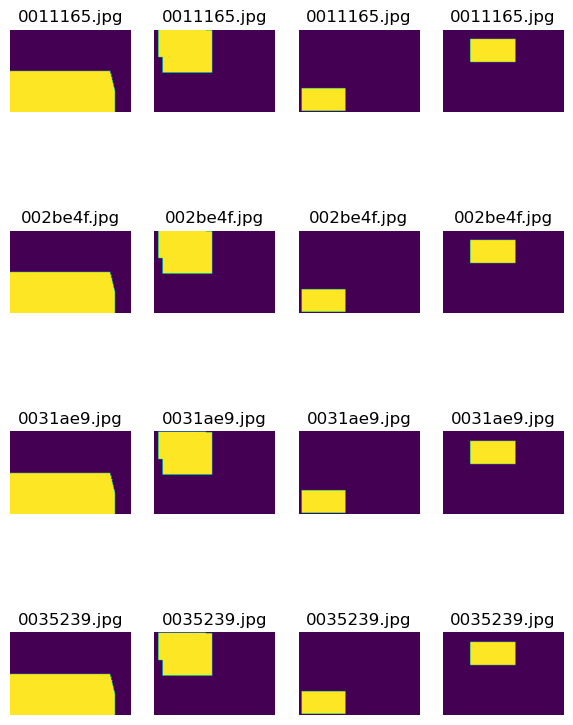

In [184]:
plt.figure(figsize=(9, 10))
for j in range(4):
    if 
    image=Image.open(train_fns[j])
    plt.subplot(4, 5, 5*(j+1))
    plt.imshow(tf.keras.utils.array_to_img(image))
    plt.axis("off")
    for i in range(4):
        plt.subplot(4, 5, (i+2+5*j))
        plt.title(img_names[j])        
        f_mask=mask_list[j]
        f_mask=f_mask[:,:,i]
        f_mask=np.expand_dims(f_mask,axis=2)
        plt.imshow(tf.keras.utils.array_to_img(f_mask))
        plt.axis("off")
plt.show();

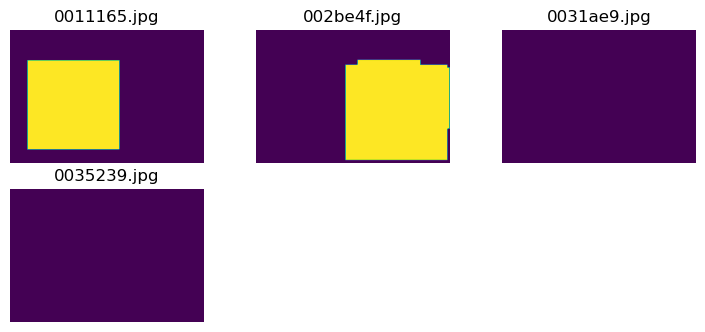

In [178]:


plt.figure(figsize=(9, 10))
for i in range(4):     
    plt.subplot(5, 3, i+1)
    plt.title(img[i]) 
    f_mask=combine_masks_func(TRAIN_PATH)
    f_mask=f_mask[:,:,i]
    f_mask=np.expand_dims(f_mask,axis=2)
    plt.imshow(tf.keras.utils.array_to_img(f_mask))
    plt.axis("off")
plt.show();

In [137]:
# combine mask function

def combine_masks_func(path: str):
  ''' Ceates a numpy mask for every 'jpg' picture in the trainingfolder(path) based on the labels in the train.csv. One mask contains multiple layers for the different categorys.
  '''
  height=352
  width = 512

  labels=("Fish", "Sugar", "Gravel", "Flower")

  train=pd.read_csv('train.csv')
  train['im_id'] = train['Image_Label'].apply(lambda x: x.split('_')[0])

  # Erstellen einer Liste train_fns, die den vollständigen Pfad der einzelnen trainingsbilder enthält
  train_fns = sorted(glob.glob(tf.compat.as_str_any(path) + '*.jpg'))
  # extaktion der Bildnamen der Bilder im Ordner mit den train bildern
  img_names=[path.split('\\')[-1] for path in train_fns]

  masks = np.zeros((height, width, 4), dtype='bool')

  for image_name in img_names:
    encoded_masks = train.loc[train['im_id'] == image_name, 'EncodedPixels']
    for idx, label in enumerate(encoded_masks.values):
      if label is not np.nan:
        mask = rle_to_mask(label)
        # resize mask
        mask = img_as_bool(resize(mask, (height, width), order=0))
        masks[:, :, idx] = mask
    return masks

In [165]:
def combine_masks_gen(path: str):
  ''' Ceates a numpy mask for every 'jpg' picture in the trainingfolder(path) based on the labels in the train.csv. One mask contains multiple layers for the different categorys.
  '''
  height=352
  width = 512

  labels=("Fish", "Sugar", "Gravel", "Flower")

  train=pd.read_csv('train.csv')
  train['im_id'] = train['Image_Label'].apply(lambda x: x.split('_')[0])

  # Erstellen einer Liste train_fns, die den vollständigen Pfad der einzelnen trainingsbilder enthält
  train_fns = sorted(glob.glob(tf.compat.as_str_any(path) + '*.jpg'))
  # extaktion der Bildnamen der Bilder im Ordner mit den train bildern
  img_names=[path.split('\\')[-1] for path in train_fns]  

  for image_name in img_names:
    masks = np.zeros((height, width, 4), dtype='bool')
    encoded_masks = train.loc[train['im_id'] == image_name, 'EncodedPixels']
    for idx, label in enumerate(encoded_masks.values):
      if label is not np.nan:
        mask = rle_to_mask(label)
        # resize mask
        mask = img_as_bool(resize(mask, (height, width), order=0))
        masks[:, :, idx] = mask
    yield masks

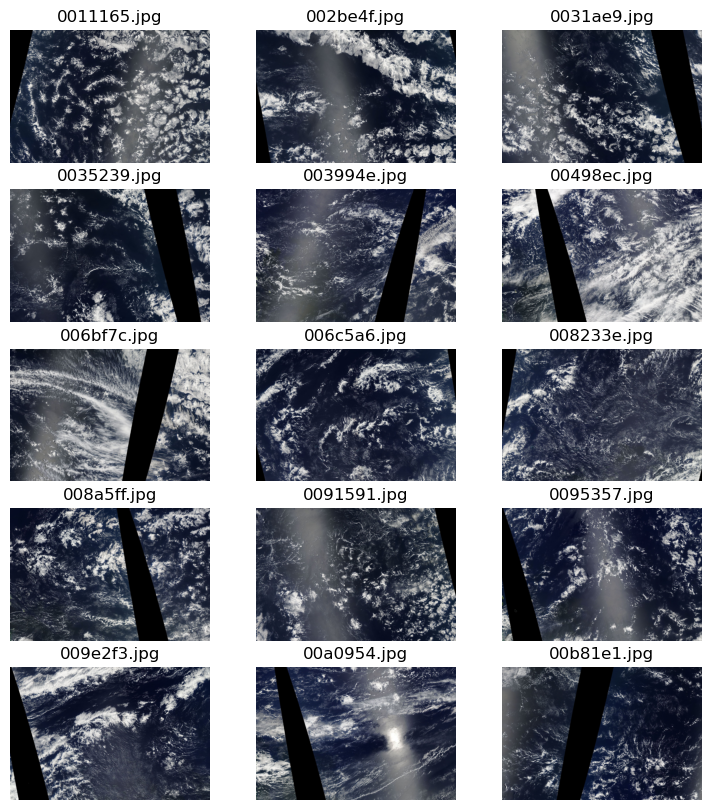

In [166]:
plt.figure(figsize=(9, 10))
for i in range(15):     
    plt.subplot(5, 3, i+1)
    plt.title(img_names[i])
    image=Image.open(train_fns[i])
    plt.imshow(tf.keras.utils.array_to_img(image))
    plt.axis("off")
plt.show();




In [167]:
# Create dataset containing the masks using the generator
spec = tf.TensorSpec(shape=(352, 512, 4), dtype=tf.float64)
ds_masks = tf.data.Dataset.from_generator(combine_masks_gen, args=[TRAIN_PATH], output_signature = spec )

In [31]:
test=next(iter(ds_masks))
print(test.shape)

(352, 512, 4)


In [151]:
test=iter(ds_masks)
for i in test:
    print(i.numpy().sum())

128267.0
158879.0
167456.0
153357.0
90109.0
77268.0
109222.0
207095.0
159409.0
101402.0
223458.0
200373.0
253221.0
234889.0
285485.0
173877.0
255018.0
271555.0
298408.0
234456.0
262274.0
258692.0
232003.0
91768.0
151479.0
210556.0
203592.0
215211.0
176870.0
182262.0
302973.0
325338.0
185062.0
151431.0
202502.0
212507.0
131599.0
152887.0
120232.0
133533.0
106761.0
201991.0
251742.0
177992.0
151921.0
193393.0
302070.0
229016.0
257906.0
267200.0
343583.0
187224.0
312857.0
274523.0
227834.0
250392.0
185977.0
219688.0
266538.0
249639.0
211040.0
91735.0
233973.0
209532.0
170840.0
277829.0
241439.0
216044.0
248144.0
223202.0
179761.0
254972.0
147330.0
177121.0
166500.0
129731.0
151959.0
235712.0
163276.0
147869.0
149315.0
245942.0
245353.0
295749.0
294238.0
195700.0
242118.0
199787.0
263617.0
189435.0
133360.0
136158.0
181882.0
193741.0
193521.0
275413.0
203491.0
139024.0
177498.0
204759.0
250303.0
257652.0
191695.0
198614.0
227610.0
225623.0
236962.0
196120.0
131210.0
193636.0
211020.0
19973

KeyboardInterrupt: 

In [132]:
test[0:50,0:50,0]

<tf.Tensor: shape=(50, 50), dtype=float64, numpy=
array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])>

In [136]:
print(test.numpy().sum())

0.0


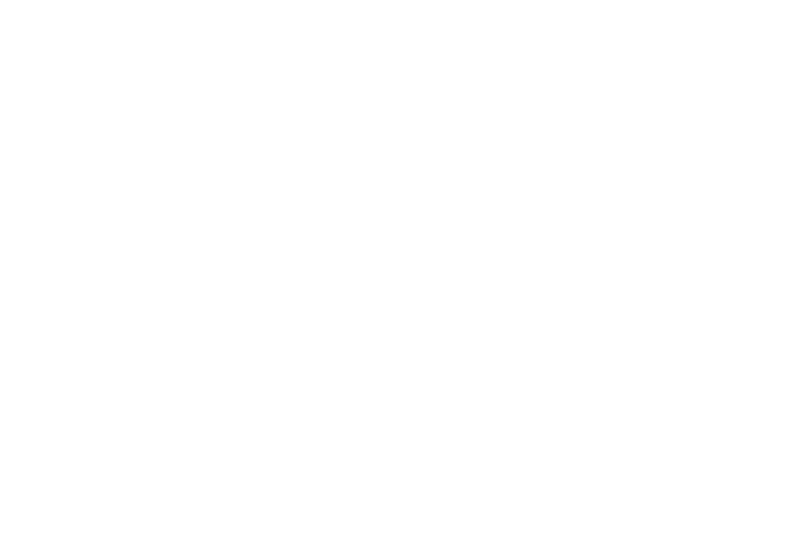

In [19]:
plt.figure(figsize=(10,10))
plt.subplot(111)
plt.imshow(tf.keras.utils.array_to_img(test))
plt.axis("off");


In [168]:
# Create dataset containing the training pictures using "image_dataset_from_directory"
ds_images = tf.keras.utils.image_dataset_from_directory(
  TRAIN_PATH,
  labels=None,
  shuffle=False,
  image_size=(img_height, img_width),
  batch_size=None)

Found 5546 files belonging to 1 classes.


**Combine genereated Datasets**

In [169]:
# Combine image dataset and masks dataset into one dataset
ds = tf.data.Dataset.zip((ds_images, ds_masks))

**Split in train/valid/test**

In [170]:
#Split#
# the dataset into train/valid/test:
ds_train= ds.take(train)
ds_valid = ds.skip(train).take(valid)
ds_test = ds.skip(train+valid).take(test)

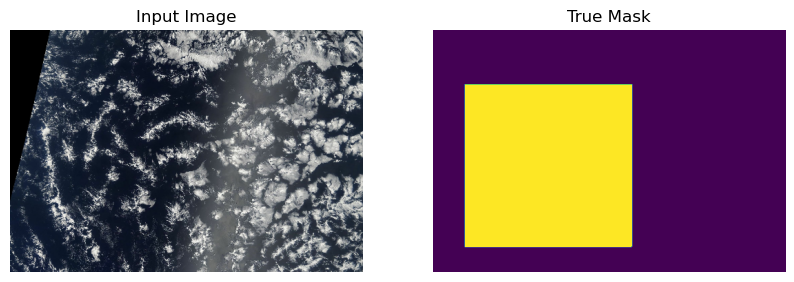

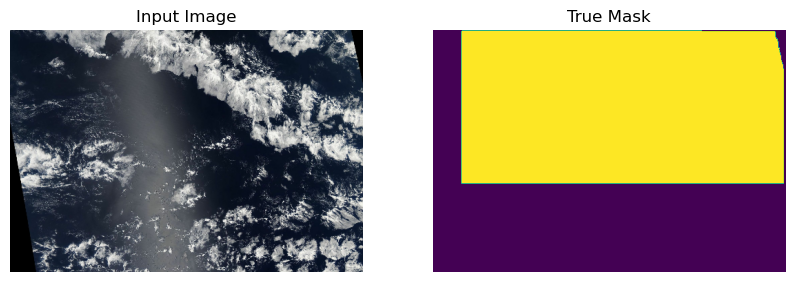

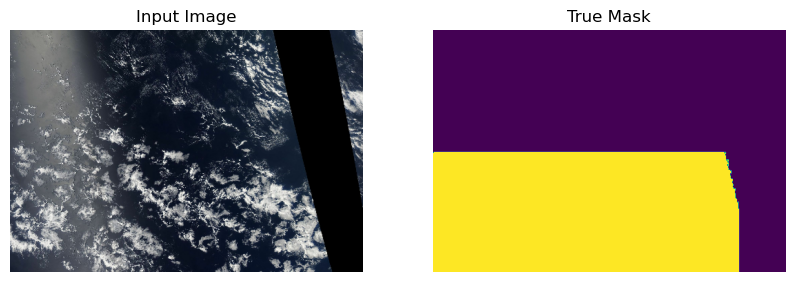

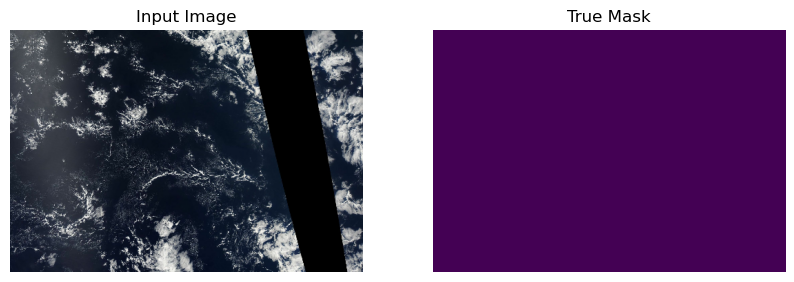

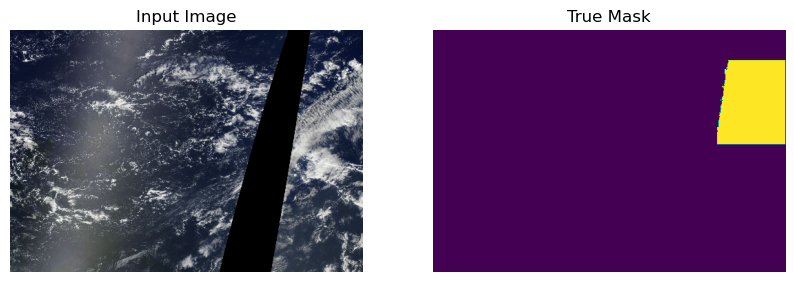

...

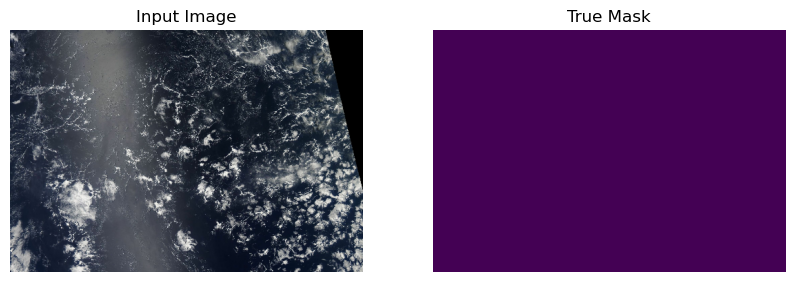

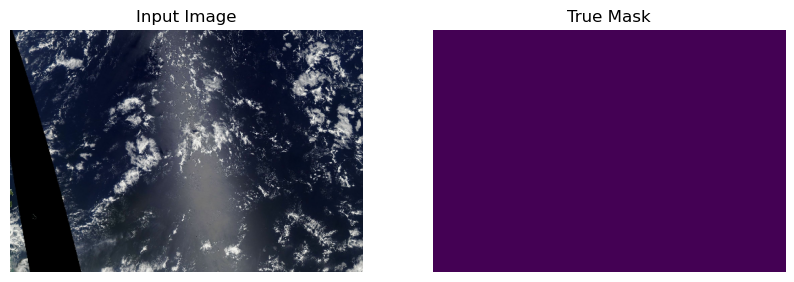

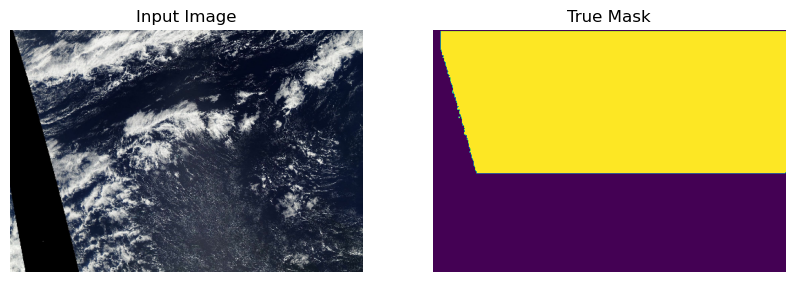

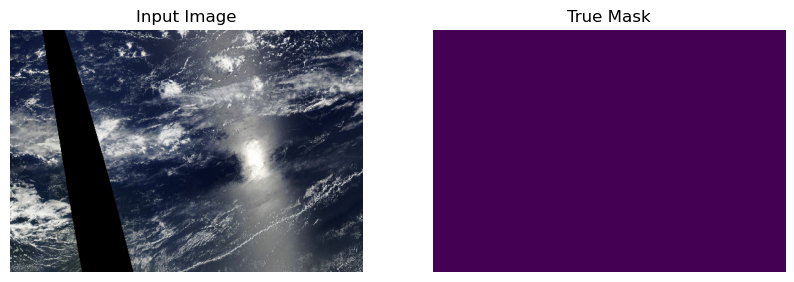

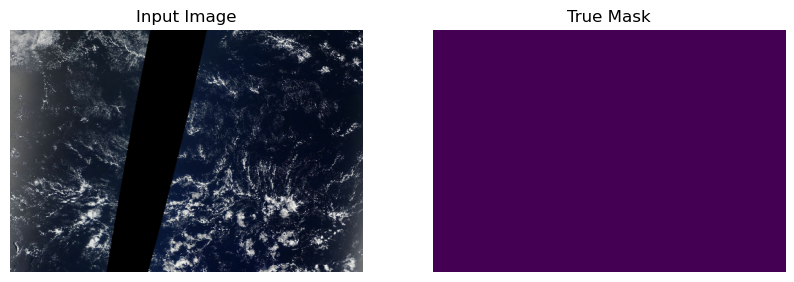

In [171]:
# Visualisation of images and masks

def show(display_list):
    plt.figure(figsize=(10, 10))
    title = ["Input Image", "True Mask", "Predicted Mask"]
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
        plt.axis("off")
    plt.show();
        #print(display_list[i].shape)

for image, mask in ds_train.take(15):
    mask = np.expand_dims(mask[:,:,0], axis=2)
    show([image, mask])


In [ ]:
def show(display_list):
    fig, ax = plt.subplots(1, len(display_list))
    fig.set_size_inches(12, 6)
    plt.figure(figsize=(40, 4))
    title = ["Input Image", "True Mask", "Predicted Mask"]
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
        plt.axis("off")
        plt.show();
        #print(display_list[i].shape)

for image, mask in ds_train.take(5):
    mask = np.expand_dims(mask[:,:,0], axis=2)
    show([image, mask])

**chache, shuffle, batch and prefetch**

In [53]:
#Split datasets into batches and use a buffer for loading the training data

batches_train = ds.cache().batch(BATCH_SIZE).repeat()
batches_valid= ds_valid.batch(BATCH_SIZE)
#batches_test = ds_test.batch(BATCH_SIZE)

#shuffle(BUFFER_SIZE).

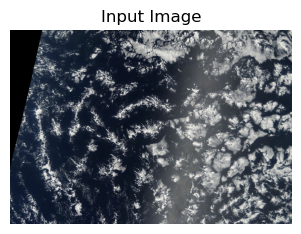

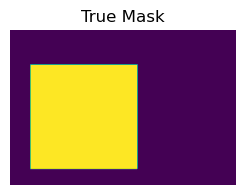

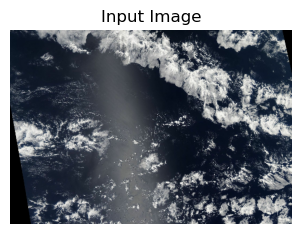

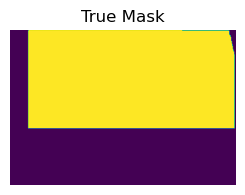

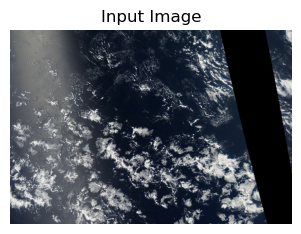

...

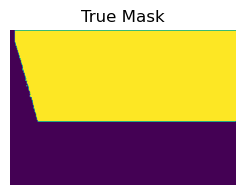

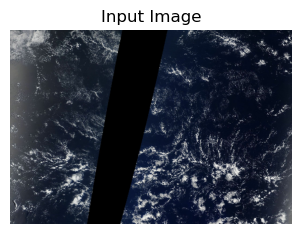

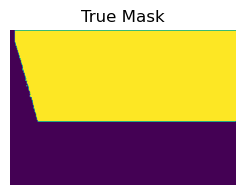

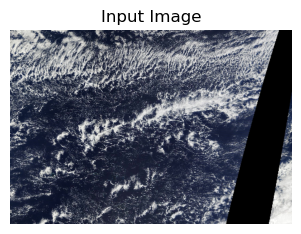

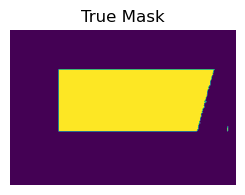

In [54]:
for image, mask in batches_train.take(1):
    for img, ma in zip(image, mask):
        ma = np.expand_dims(ma[:,:,0], axis=2)
        show([img, ma])

In [116]:
# Application of the preprocessing

batches_train_aug = batches_train.map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
batches_valid_aug = batches_train.map(load_image_test, num_parallel_calls=tf.data.AUTOTUNE)

In [ ]:
batches_train_aug = batches_train.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

Visualisation of augmeted images and masks

In [154]:
for image, mask in batches_train.take(5):
    mask = np.expand_dims(mask[0,:,:,0], axis=2)
    show([image[0], mask])


KeyboardInterrupt: 

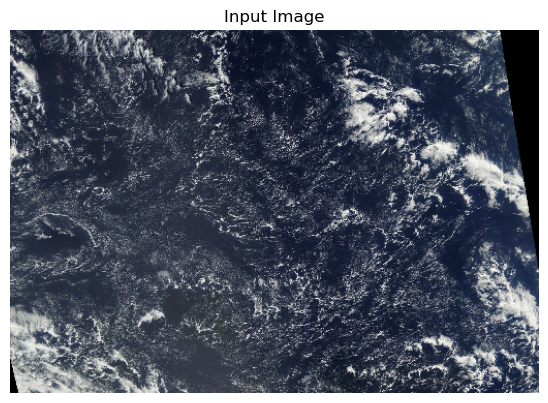

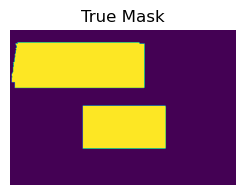

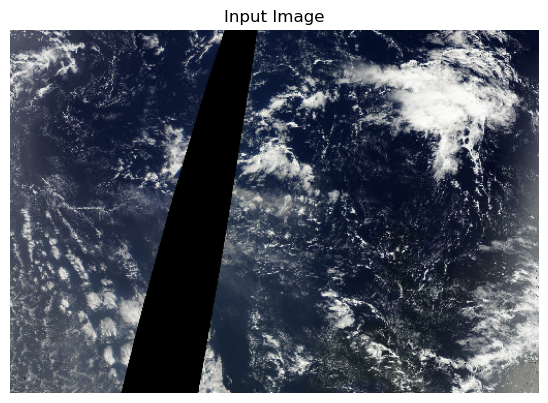

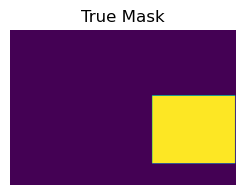

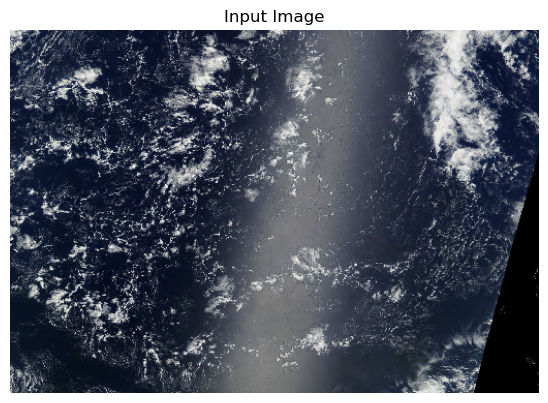

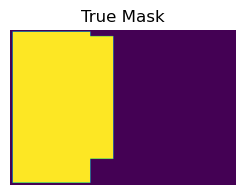

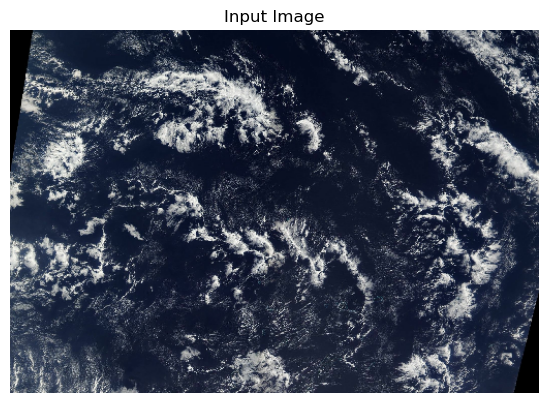

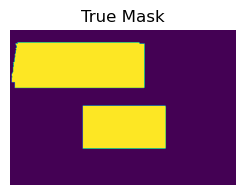

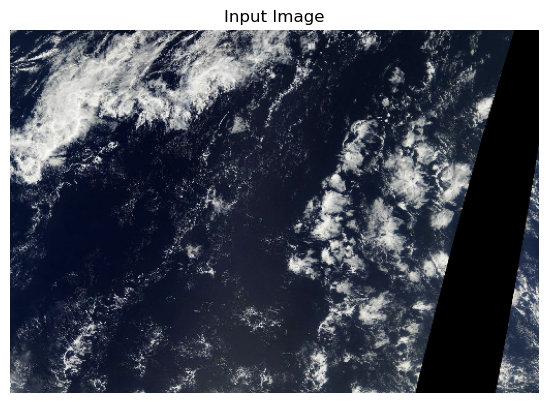

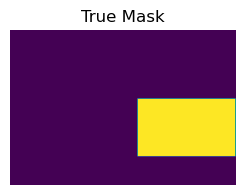

In [156]:
#non batch
for image, mask in batches_train.take(5):
    mask = np.expand_dims(mask[:,:,0], axis=2)
    show([image, mask])

**Modeling**

In [100]:
# Unet

#from skimage.io import imread, imshow
#from sklearn.model_selection import train_test_split

num_classes = 4

inputs = tf.keras.layers.Input((352, 512, 3))

#Contraction path
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
b1 = tf.keras.layers.BatchNormalization()(c1)
r1 = tf.keras.layers.ReLU()(b1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(r1)

c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
b2 = tf.keras.layers.BatchNormalization()(c2)
r2 = tf.keras.layers.ReLU()(b2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(r2)

c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
b3 = tf.keras.layers.BatchNormalization()(c3)
r3 = tf.keras.layers.ReLU()(b3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(r3)

c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
b4 = tf.keras.layers.BatchNormalization()(c4)
r4 = tf.keras.layers.ReLU()(b4)
p4 = tf.keras.layers.MaxPooling2D((2, 2))(r4)

c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
b5 = tf.keras.layers.BatchNormalization()(c5)
r5 = tf.keras.layers.ReLU()(b5)
c5 = tf.keras.layers.Dropout(0.3)(r5)
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

#Expansive path
u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
u6 = tf.keras.layers.BatchNormalization()(u6)
u6 = tf.keras.layers.ReLU()(u6)


u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(u6)
u7 = tf.keras.layers.concatenate([u7, c3])
u7 = tf.keras.layers.BatchNormalization()(u7)
u7 = tf.keras.layers.ReLU()(u7)


u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(u7)
u8 = tf.keras.layers.concatenate([u8, c2])
u8 = tf.keras.layers.BatchNormalization()(u8)
u8 = tf.keras.layers.ReLU()(u8)

u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(u8)
u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
u9 = tf.keras.layers.BatchNormalization()(u9)
u9 = tf.keras.layers.ReLU()(u9)


outputs = tf.keras.layers.Conv2D(num_classes, (1, 1), activation='sigmoid')(u9)

In [101]:
# Diceloss alternative

def DiceLoss(targets, inputs, smooth=1e-6):

    #flatten label and prediction tensors
    inputs = tf.nest.flatten(inputs)
    targets = tf.nest.flatten(targets)

    intersection = tf.reduce_sum(tf.math.multiply(targets, inputs))
    dice = (2*intersection + smooth) / (tf.reduce_sum(targets) + tf.reduce_sum(inputs) + smooth)
    return 1 - dice

**Dice coefficient as loss-function and metric**

In [102]:
# Dice coefficient to be used as metric

def dice_coeff(y_true, y_pred):
    smooth = 1.
    # Flatten
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)
    return score

In [103]:
# Diceloss

def dice_loss(y_true, y_pred):
    loss = 1 - dice_coeff(y_true, y_pred)
    return loss

**Model Compilation and fitting**

In [124]:
#model compilation

# changed learningrate from 0.001 to 0.005
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)

model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer=optimizer, loss=dice_loss, metrics=['accuracy',[dice_coeff]])

#tf.keras.utils.plot_model(model, "model.png")

In [ ]:
model.summary()


In [95]:
#callbacks

# Include the epoch in the file name (uses `str.format`)
checkpoint_path = "Checkpoints/cp-{epoch:04d}.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights every 2 epochs
cp_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_path, 
    verbose=1, 
    save_weights_only=True,
    save_freq=2*BATCH_SIZE)

reduce_learning_rate = tf.keras.callbacks.ReduceLROnPlateau(
                                    monitor="val_loss",
                                    factor=0.3,
                                    patience=2, #wird aktiv, wenn die Verbesserung von val_loss für 2 epochen stagniert                                                                      
                                    cooldown = 3, # number of epochs to wait before resuming normal operation after  lr has been reduced.
                                    verbose=1)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=5, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs'),
        reduce_learning_rate,
        cp_callback]



In [127]:
# model fit variante aus "Unet segmentation in keras"

STEPS_PER_EPOCH = train // BATCH_SIZE
VALIDATION_STEPS = valid // BATCH_SIZE // VAL_SUBSPLITS
model_history = model.fit(batches_train,
                              epochs=NUM_EPOCHS,
                              steps_per_epoch=STEPS_PER_EPOCH,
                              validation_steps=VALIDATION_STEPS,
                              validation_data=batches_valid,
                              callbacks=callbacks)

Epoch 1/15
309/309 [==============================] - 2030s 7s/step - loss: 0.4761 - accuracy: 0.3268 - dice_coeff: 0.5239 - val_loss: 0.4751 - val_accuracy: 0.3318 - val_dice_coeff: 0.5249 - lr: 0.0015
Epoch 2/15
309/309 [==============================] - 2062s 7s/step - loss: 0.4752 - accuracy: 0.3230 - dice_coeff: 0.5251 - val_loss: 0.4902 - val_accuracy: 0.2856 - val_dice_coeff: 0.5098 - lr: 0.0015
Epoch 3/15
309/309 [==============================] - ETA: 0s - loss: 0.4747 - accuracy: 0.3152 - dice_coeff: 0.5251
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.00045000000391155477.
309/309 [==============================] - 2062s 7s/step - loss: 0.4747 - accuracy: 0.3152 - dice_coeff: 0.5251 - val_loss: 0.4785 - val_accuracy: 0.2774 - val_dice_coeff: 0.5215 - lr: 0.0015
Epoch 4/15
309/309 [==============================] - 2102s 7s/step - loss: 0.4725 - accuracy: 0.2968 - dice_coeff: 0.5277 - val_loss: 0.4709 - val_accuracy: 0.2804 - val_dice_coeff: 0.5291 - lr: 4.5000e-04
E

In [120]:
model.save_weights('saved_model_2/')
#model.save('complete_saved_model_2/')

In [121]:
del model

In [47]:
model = tf.keras.models.load_model('complete_saved_model/')                 

ValueError: Unable to restore custom object of type _tf_keras_metric. Please make sure that any custom layers are included in the `custom_objects` arg when calling `load_model()` and make sure that all layers implement `get_config` and `from_config`.

In [126]:
model.load_weights('saved_model_2/')

In [58]:
# Re-evaluate the model

#test_batch = next(iter(batches_test))
#random_index = np.random.choice(test_batch[0].shape[0])
#sample_image, sample_mask = sample_batch[0][random_index], sample_batch[1][random_index]

test_images=ds_test.take(10)
test_masks=ds_test.take(10)

loss, acc = model.evaluate(batches_valid, verbose=2)
print("Restored model, accuracy: {:5.2f}%".format(100 * acc))

TypeError: 'NoneType' object is not callable

In [48]:
print(tf.version.VERSION)

2.10.0


In [ ]:
print(model.history.history.keys())

**Model evaluation**

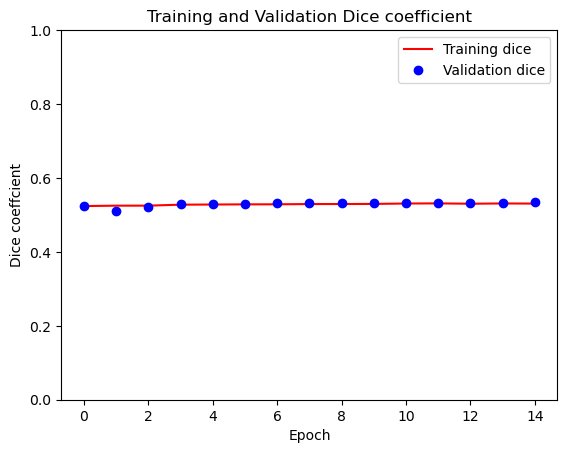

In [128]:
# Model evaluation

dice = model.history.history['dice_coeff']
val_dice = model.history.history['val_dice_coeff']

plt.figure()
plt.plot( dice, 'r', label='Training dice')
plt.plot( val_dice, 'bo', label='Validation dice')
plt.title('Training and Validation Dice coefficient')
plt.xlabel('Epoch')
plt.ylabel('Dice coeffcient')
plt.ylim([0, 1])
plt.legend()
plt.show()

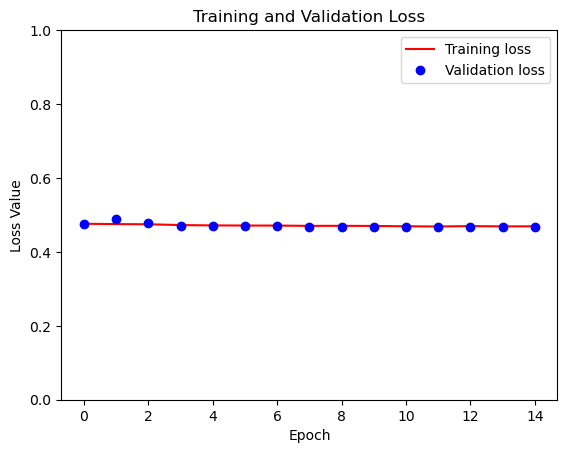

In [129]:
# Model evaluation

loss = model.history.history['loss']
val_loss = model.history.history['val_loss']
accuracy = model.history.history['accuracy']

plt.figure()
plt.plot( loss, 'r', label='Training loss')
plt.plot( val_loss, 'bo', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.legend()
plt.show()

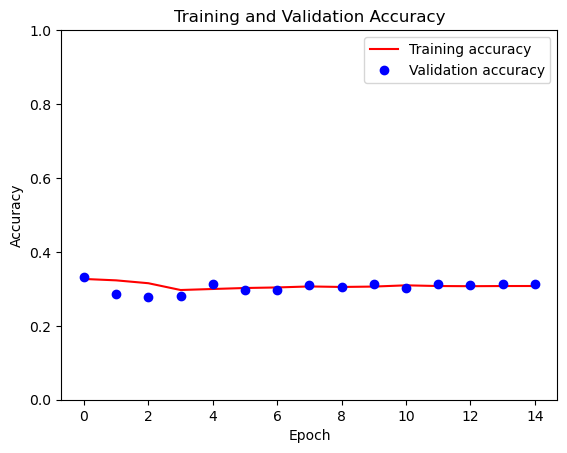

In [130]:
accuracy = model.history.history['accuracy']
val_acc = model.history.history['val_accuracy']

plt.figure()
plt.plot( accuracy, 'r', label='Training accuracy')
plt.plot( val_acc, 'bo', label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend()
plt.show()

**Test**

(16, 352, 512, 3)
1/1 [==============================] - 1s 894ms/step
(16, 352, 512, 4)


array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0,

pixels overall 180224
pixels=1 104087


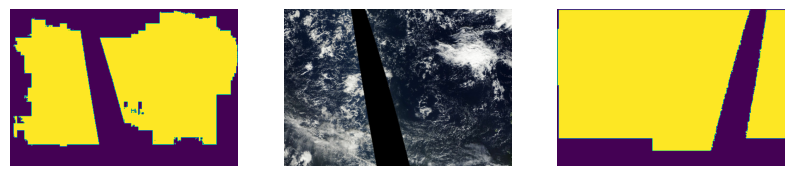

In [133]:


for image, mask in batches_train.take(1):
  print(image.shape)
  pred_mask = model.predict(image)
  print(pred_mask.shape)
  pred_mask = (pred_mask>0.5)+0
  display(pred_mask[0,0:20,0:20,0])
  pred_mask=pred_mask[0,:,:,0]
  pred_mask = np.expand_dims(pred_mask, axis=2)
  plt.figure(figsize=(10, 10))
  plt.subplot(131)
  plt.imshow(tf.keras.utils.array_to_img(pred_mask))
  plt.axis("off")
  plt.subplot(132)
  image=image[0,:,:,:]
  plt.imshow(tf.keras.utils.array_to_img(image))
  plt.axis("off")
  plt.subplot(133)
  mask=mask[0,:,:,0]
  mask = np.expand_dims(mask, axis=2)
  plt.imshow(tf.keras.utils.array_to_img(mask))
  plt.axis("off")

  print('pixels overall', pred_mask.shape[0]*pred_mask.shape[1] )
  print('pixels=1', pred_mask.sum().sum())


**Making predictions**

In [136]:
def create_mask(pred_mask):
    pred_mask = (pred_mask>0.75)+0
    pred_mask = pred_mask[0,:,:,0]
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask

def show_predictions(dataset=None, num=5):
    for image, mask in dataset.take(num):
        mask = mask[0,:,:,0]
        mask = mask[..., tf.newaxis]
        #mask = np.expand_dims(mask[0,:,:,1], axis=2)
        pred_mask = create_mask(model.predict(image))        
        show([image[0], mask, pred_mask])


1/1 [==============================] - 1s 666ms/step


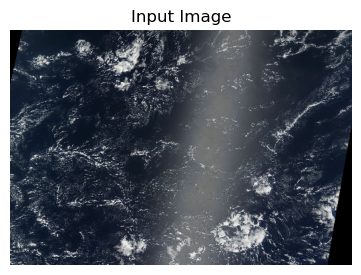

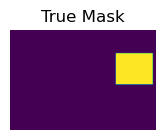

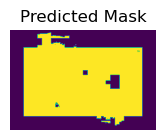

1/1 [==============================] - 1s 584ms/step


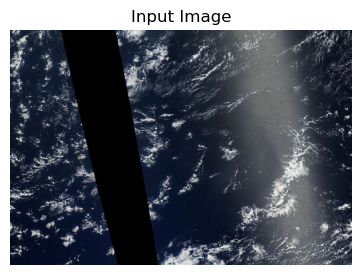

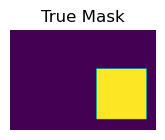

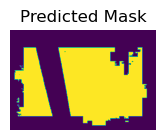

1/1 [==============================] - 1s 583ms/step


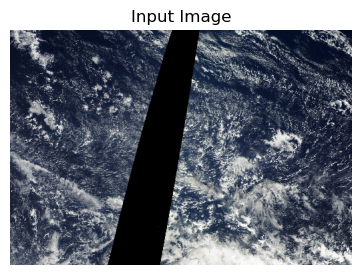

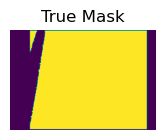

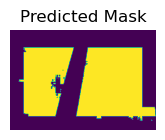

1/1 [==============================] - 1s 542ms/step


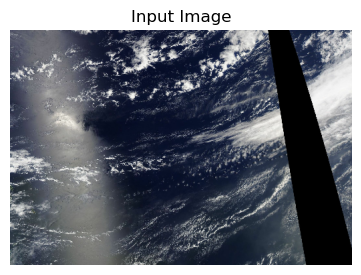

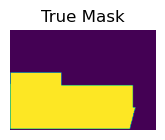

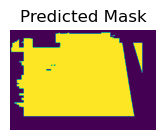

1/1 [==============================] - 1s 547ms/step


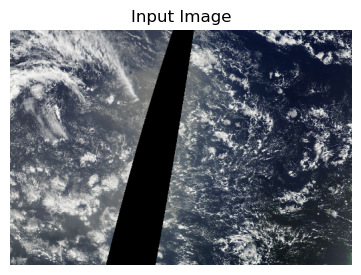

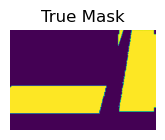

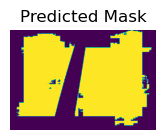

In [137]:
show_predictions(batches_train)

In [123]:
# modified function from "U-net segmentation in Keras"

sample_batch = next(iter(batches_train))
random_index = np.random.choice(sample_batch[0].shape[0])
sample_image, sample_mask = sample_batch[0][random_index], sample_batch[1][random_index]
show_predictions([sample_image, sample_mask])



AttributeError: 'list' object has no attribute 'take'

In [ ]:
# original functions from "U-net segmentation in Keras"

def display(display_list):
 plt.figure(figsize=(15, 15))
 title = ["Input Image", "True Mask", "Predicted Mask"]
 for i in range(len(display_list)):
   plt.subplot(1, len(display_list), i+1)
   plt.title(title[i])
   plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
   plt.axis("off")
 plt.show()

sample_batch = next(iter(train_batches))
random_index = np.random.choice(sample_batch[0].shape[0])
sample_image, sample_mask = sample_batch[0][random_index], sample_batch[1][random_index]
display([sample_image, sample_mask])

def create_mask(pred_mask):
 pred_mask = tf.argmax(pred_mask, axis=-1)
 pred_mask = pred_mask[..., tf.newaxis]
 return pred_mask[0]

def show_predictions(dataset=None, num=1):
 if dataset:
   for image, mask in dataset.take(num):
     pred_mask = model.predict(image)
     display([image[0], mask[0], create_mask(pred_mask)])
 else:
   display([sample_image, sample_mask,
            create_mask(model.predict(sample_image[tf.newaxis, ...]))])
count = 0
for i in test_batches:
   count +=1
print("number of batches:", count)